Code for **"Flash/No Flash"** figure. 

# Import libs

In [1]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import torch
import torch.optim

from utils.denoising_utils import *
from utils.sr_utils import load_LR_HR_imgs_sr
torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor
# dtype = torch.FloatTensor

imsize =-1
PLOT = True
# del net
torch.cuda.empty_cache()
torch.manual_seed(0)
np.random.seed(0)

# Load image

HR and LR resolutions: (768, 704), (768, 704)
HR and LR resolutions: (768, 704), (768, 704)
HR and LR resolutions: (768, 704), (768, 704)


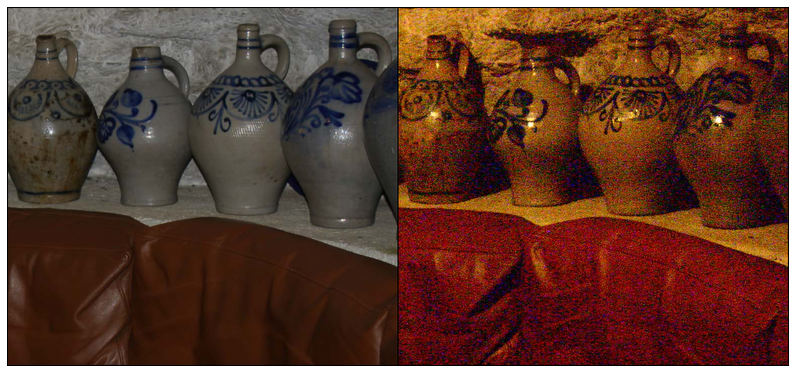

In [2]:
imgs = load_LR_HR_imgs_sr('data/flash_no_flash/cave01_00_flash.jpg', -1, 1, enforse_div32='CROP')
img_flash = load_LR_HR_imgs_sr('data/flash_no_flash/cave01_00_flash.jpg', -1, 1, enforse_div32='CROP')['HR_pil']
img_flash_np = pil_to_np(img_flash)

img_noflash = load_LR_HR_imgs_sr('data/flash_no_flash/cave01_01_noflash.jpg', -1, 1, enforse_div32='CROP')['HR_pil']
img_noflash_np = pil_to_np(img_noflash)

g = plot_image_grid([img_flash_np, img_noflash_np],3,12)

# Setup

In [3]:
pad = 'reflection'
OPT_OVER = 'net'

num_iter = 601
LR = 0.1 
OPTIMIZER = 'adam'
reg_noise_std = 0.0
show_every = 50
figsize = 6

# We will use flash image as input
input_depth = 3
net_input =np_to_torch(img_flash_np).type(dtype)


def tic():
    #Homemade version of matlab tic and toc functions
    import time
    global startTime_for_tictoc
    startTime_for_tictoc = time.time()

def toc():
    import time
    duration = time.time() - startTime_for_tictoc
    if 'startTime_for_tictoc' in globals():
        print("Elapsed time is " + str(duration) + " seconds.")
    else:
        print("Toc: start time not set")
    return duration

In [4]:
nchan = 32
# from models.decp_skip import decp_skip
# net = skip(input_depth, 3, num_channels_down = [nchan]*5, 
#                         num_channels_up   = [nchan]*5,
#                         num_channels_skip = [4, 4, 4, 4, 4], 
#                         upsample_mode=['nearest', 'nearest', 'bilinear', 'bilinear', 'bilinear'], 
#                         need_sigmoid=True, need_bias=True, pad=pad).type(dtype)
print(decp_skip)
nlayers=4 #5
net_base,net_hl = decp_skip(input_depth, 3, num_channels_down = [nchan]*nlayers, 
                        num_channels_up   = [nchan]*nlayers,
                        num_channels_skip = [4]*nlayers, 
                        upsample_mode=['nearest', 'nearest', 'bilinear', 'bilinear', 'bilinear'], 
                        need_sigmoid=True, need_bias=True, pad=pad)
net_base.type(dtype)
net_hl.type(dtype)
mse = torch.nn.MSELoss().type(dtype)

img_flash_var = np_to_torch(img_flash_np).type(dtype)
img_noflash_var = np_to_torch(img_noflash_np).type(dtype)

<function decp_skip at 0x000001B1155806A8>


In [5]:
from pdb import set_trace
import cv2
def _init_dcvx_parameters(net_to_dcvx):
    # parameters = [p for p in self.image_net.named_parameters()] + \
    #              [p for p in self.mask_net.named_parameters()]
    #     net_to_dcvx = [self.left_net,self.right_net]
    # if self._is_learning_ambient():
    #     net_to_dcvx.append(self.ambient_net)

    # set_trace()
    parameters = list()
    layer_id = 0
    for net in net_to_dcvx:
        # for name, p  in net.named_parameters():
        #     print(name, end=' ')
        
        # set_trace()
        for name, p  in net.named_parameters():
            layer_id +=1
            if "weight" in name and layer_id>7 and p.dim()>1:
                parameters.append(p)
                print(name)
    return parameters

def dcvx(parameters):
    neg_weight_reg  = 0.0 
    #parameters =self.dcvx_parameters
    for p in parameters:
        neg_weight_reg += torch.norm(p[p<0])
    return neg_weight_reg

dcvx_ = 1
dcvx_coeff= 0.00001
# parameters = _init_dcvx_parameters([net])
parameters = _init_dcvx_parameters([net_base, net_hl])

1.1.4.1.weight
1.1.7.1.0.1.1.weight
1.1.7.1.1.1.1.weight
1.1.7.1.1.4.1.weight
1.1.7.1.1.7.1.0.1.1.weight
1.1.7.1.1.7.1.1.1.1.weight
1.1.7.1.1.7.1.1.4.1.weight
1.1.7.1.1.7.3.1.weight
1.1.7.1.1.7.6.1.weight
1.1.7.3.1.weight
1.1.7.6.1.weight
3.1.weight
6.1.weight
1.0.1.1.weight
1.1.1.1.weight
1.1.4.1.weight
3.1.weight
6.1.weight
9.1.weight


In [6]:
# print(parameters)

# Optimize

Starting optimization with ADAM


c:\users\wnjq9\.conda\envs\siammask\lib\site-packages\torch\nn\functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


dcvx_loss:tensor(0.0004) total_loss:tensor(0.1410)


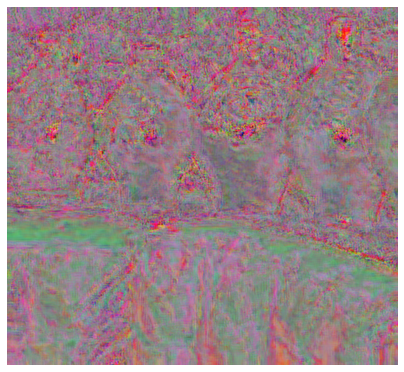

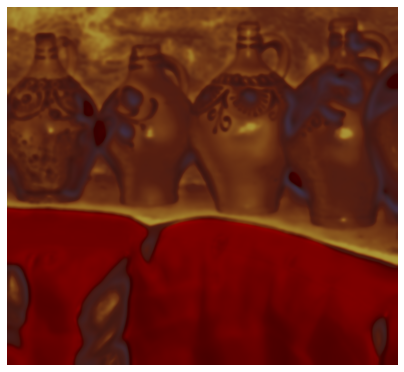

dcvx_loss:tensor(0.0064) total_loss:tensor(0.0116)


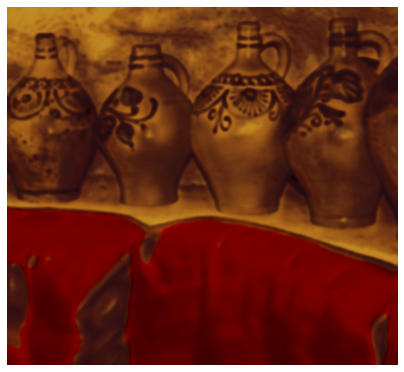

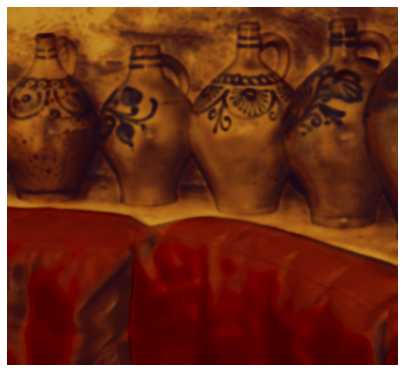

dcvx_loss:tensor(0.0064) total_loss:tensor(0.0107)


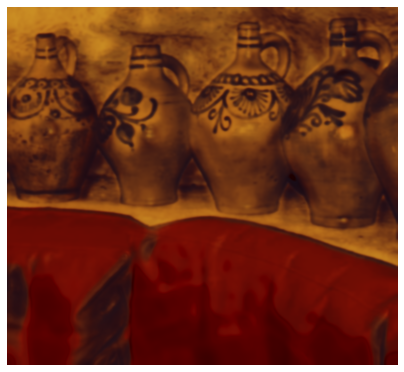

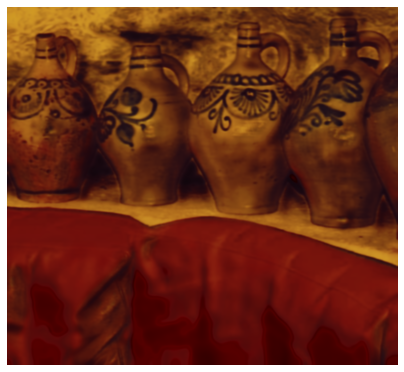

dcvx_loss:tensor(0.0064) total_loss:tensor(0.0086)


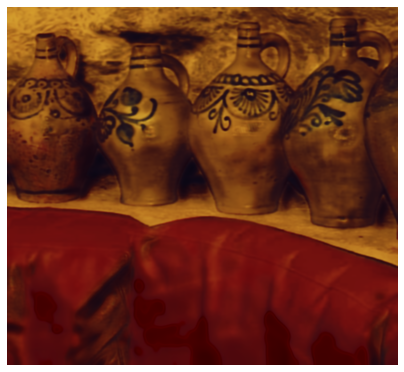

Elapsed time is 73.8534185886383 seconds.


In [7]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()


i = 0

stop_dcvx =0
feat = 0
out_list= list()
out_list.append(img_flash_np)
loss_list = list()
# PLOT = False
def closure():
    
    global i, net_input, dcvx_, stop_dcvx, feat,loss_list,dcvx_coeff
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    #out = net(net_input)
    feat = net_base(net_input)
    out = net_hl(feat)
   
    total_loss = mse(out, img_noflash_var)
    if i%20==0:loss_list.append(total_loss.data.cpu())
    if dcvx_ and i%100==0:
        dcvx_loss = dcvx(parameters)*dcvx_coeff
        if i%50==0:
            print("dcvx_loss:"+str(dcvx_loss.data.cpu())+ " total_loss:"+str(total_loss.data.cpu()))
        if dcvx_loss.data.cpu()> (total_loss.data.cpu()*4):
            dcvx_coeff = dcvx_coeff*0.25
        #total_loss += dcvx_loss
            
        #dcvx_loss += total_loss
        total_loss2 = total_loss+ dcvx_loss
        total_loss2.backward()
    else:
        total_loss.backward()
    

    print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        filename = "result/flash/flash_iter"+str(i)
        if dcvx_:filename = filename+"_dcvx_"+str(dcvx_coeff)
        filename = filename+".jpg"
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1,name=filename)
        if i% (show_every*4)==0:out_list.append(np.clip(out_np, 0, 1))
        
       
        
        #plt.imshow(np.clip(out_np, 0, 1))
        #plt.savefig(filename)
    i += 1

    return total_loss

# dcvx_ = 0
# # one stage optimization, optimize to the end
# # p = get_params(OPT_OVER, net, net_input)
# p = get_params(OPT_OVER, net_base, net_input)+get_params(OPT_OVER, net_hl, net_input)
# num_iter=601
# tic()
# opt_adam = optimize(OPTIMIZER, p, closure, LR, num_iter)

loss_list = list()
# try to optimize for several iteration and alternate variables
# net_base,net_hl = decp_skip(input_depth, 3, num_channels_down = [nchan]*nlayers, 
#                         num_channels_up   = [nchan]*nlayers,
#                         num_channels_skip = [4]*nlayers, 
#                         upsample_mode=['nearest', 'nearest', 'bilinear', 'bilinear', 'bilinear'], 
#                         need_sigmoid=True, need_bias=True, pad=pad)
# net_base.type(dtype)
# net_hl.type(dtype)
p = get_params(OPT_OVER, net_base, net_input)+get_params(OPT_OVER, net_hl, net_input)
num_iter=301
tic()
opt_adam = optimize(OPTIMIZER, p, closure, LR*1.2, num_iter)
duration_1stage= toc()/num_iter


In [8]:
loss_baseline=[0.1340961 ,0.01548285,0.01211238,0.01005663,0.00918795,0.00910525
,0.00853373,0.00802489,0.00786717,0.00775575,0.00760975,0.00747442
,0.00758593,0.00759378,0.00728876,0.00746258,0.00713101,0.00719243
,0.00720245,0.0070123 ,0.00717118,0.00700233,0.00732294,0.00691183
,0.00694715,0.00689156,0.00696544,0.00675416,0.00697585,0.00671998
,0.00688681,0.00673222,0.00669512,0.00668074,0.00680463,0.00666515
,0.00672861,0.00671239,0.00670822,0.00656649,0.00672815,0.00657432
,0.00661412,0.00655959,0.00654992,0.00658125,0.00652036,0.00652542
,0.00649254,0.00651485,0.00646331]
print(loss_baseline)
dua_baseline =141.2/1000  # seconds per iteration
# numiters= len(loss_list)
# loss_baseline = np.asarray(loss_baseline)
# from scipy import interpolate

# f = interpolate.interp1d(np.arange(numiters)*dua_baseline, loss_list)

print(loss_list)


[0.1340961, 0.01548285, 0.01211238, 0.01005663, 0.00918795, 0.00910525, 0.00853373, 0.00802489, 0.00786717, 0.00775575, 0.00760975, 0.00747442, 0.00758593, 0.00759378, 0.00728876, 0.00746258, 0.00713101, 0.00719243, 0.00720245, 0.0070123, 0.00717118, 0.00700233, 0.00732294, 0.00691183, 0.00694715, 0.00689156, 0.00696544, 0.00675416, 0.00697585, 0.00671998, 0.00688681, 0.00673222, 0.00669512, 0.00668074, 0.00680463, 0.00666515, 0.00672861, 0.00671239, 0.00670822, 0.00656649, 0.00672815, 0.00657432, 0.00661412, 0.00655959, 0.00654992, 0.00658125, 0.00652036, 0.00652542, 0.00649254, 0.00651485, 0.00646331]
[tensor(0.1410), tensor(0.0181), tensor(0.0144), tensor(0.0132), tensor(0.0120), tensor(0.0116), tensor(0.0115), tensor(0.0108), tensor(0.0106), tensor(0.0100), tensor(0.0107), tensor(0.0096), tensor(0.0097), tensor(0.0091), tensor(0.0091), tensor(0.0086)]


In [9]:

        
def closure_bfgs():
    
    global i, feat_opt,feat_ref, dcvx_, stop_dcvx, out_list#, feat_fix 
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    #out = net(net_input)
    #feat = net_base(net_input)
    #out = net_hl(feat_opt)
    out = net_hl(feat_opt)
    #set_trace()
    #print("feat opt grad"+str(feat_opt.data.mean()))
    
   
    total_loss = mse(out, img_noflash_var)
    if i%20==0:loss_list2.append(total_loss.data.cpu())
    dcvx_loss  = mse(feat_opt, feat_ref)*1.1
    if i%50==0:print( " total_loss:"+str(total_loss.data.cpu()))
    total_loss2 = total_loss + dcvx_loss
    #total_loss = total_loss*20.0
    total_loss2.backward()
    

    print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        filename = "result/flash/flash_iter"+str(i)
        if dcvx_:filename = filename+"_dcvx_"+str(dcvx_coeff)
        filename = filename+".jpg"
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1,name=filename)
        if i% (show_every*4)==0:out_list.append(np.clip(out_np, 0, 1))
       
        
        #plt.imshow(np.clip(out_np, 0, 1))
        #plt.savefig(filename)
    i += 1

    return total_loss


In [10]:
# plt.savefig('jq_flash.pdf')
# torch.cuda.empty_cache() 

feat_ref = net_base(net_input).detach()
# del net_base
del opt_adam
del feat

In [11]:
# del net_base
torch.cuda.empty_cache() 

feat_opt shape:torch.Size([1, 32, 704, 768])
Starting optimization with LBFGS
 total_loss:tensor(0.0088)


c:\users\wnjq9\.conda\envs\siammask\lib\site-packages\torch\nn\functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


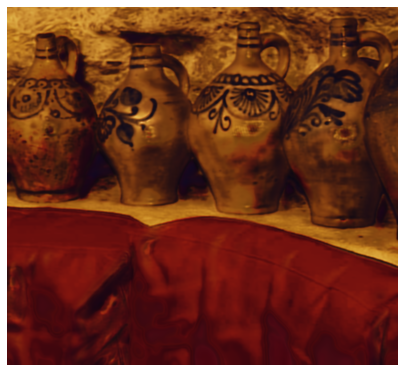

 total_loss:tensor(0.0083)008305 


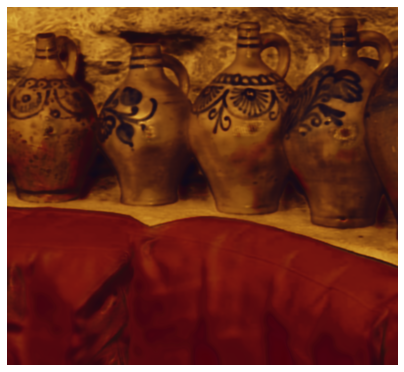

 total_loss:tensor(0.0073)007380 


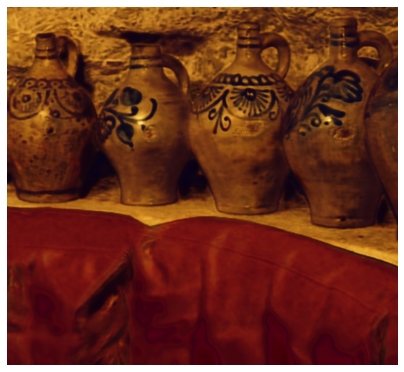

 total_loss:tensor(0.0063)006323 


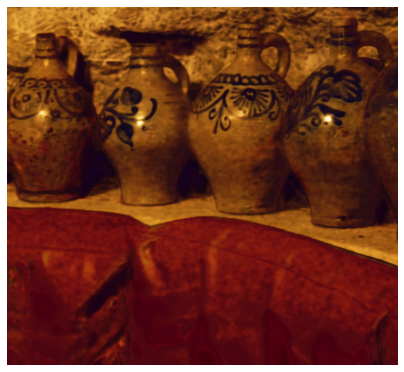

 total_loss:tensor(0.0059)005867 


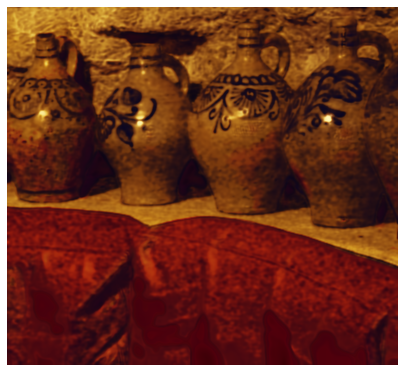

 total_loss:tensor(0.0056)005587 


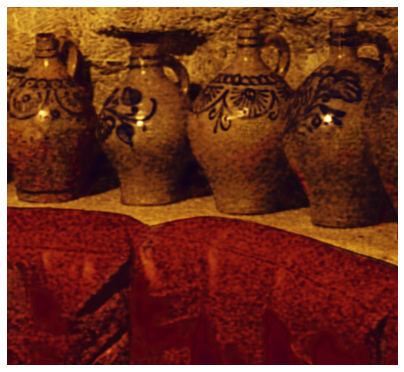

 total_loss:tensor(0.0053)005318 


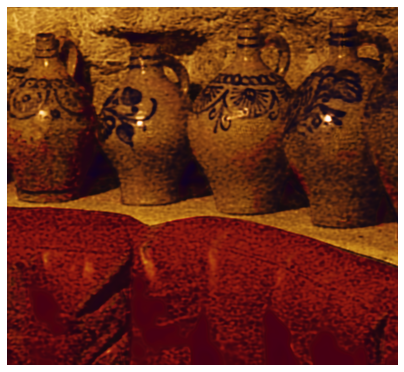

 total_loss:tensor(0.0052)005156 


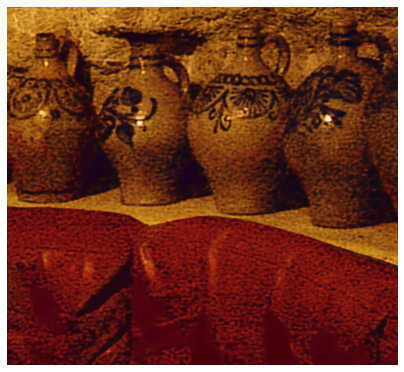

 total_loss:tensor(0.0050)004954 


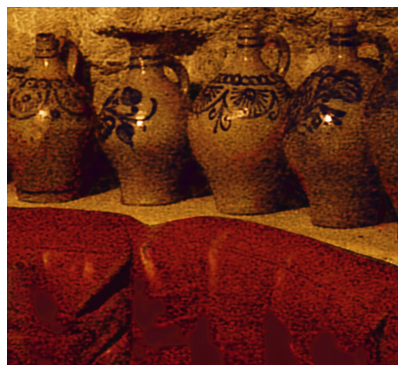

 total_loss:tensor(0.0048)004813 


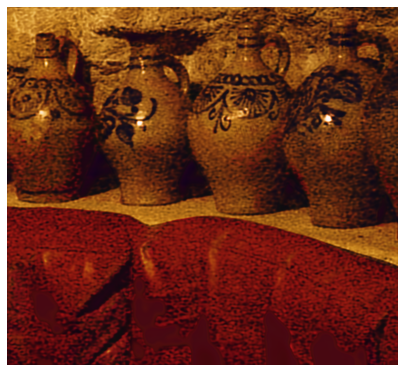

 total_loss:tensor(0.0047)004700 


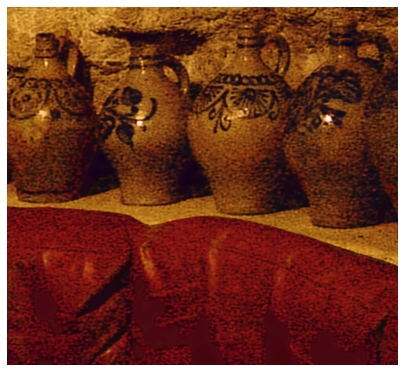

 total_loss:tensor(0.0046)004574 


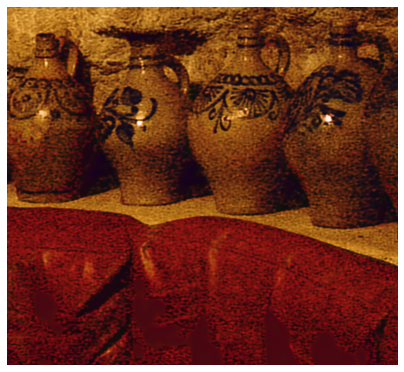

 total_loss:tensor(0.0045)004473 


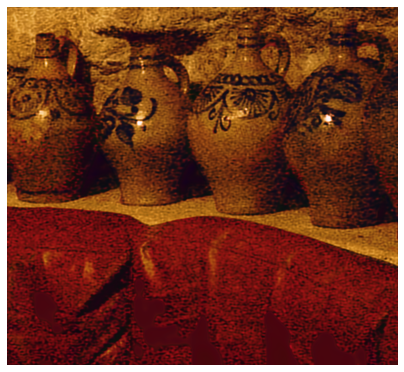

 total_loss:tensor(0.0044)004385 


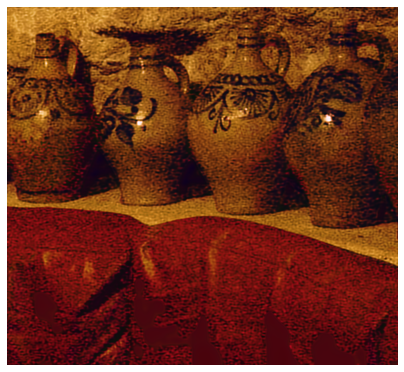

 total_loss:tensor(0.0043)004299 


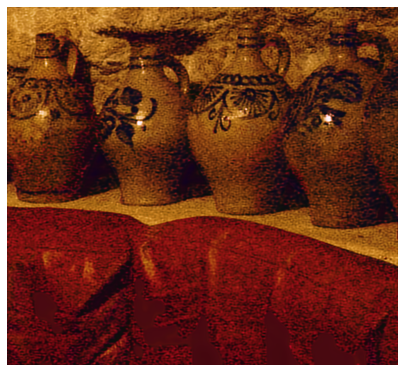

 total_loss:tensor(0.0042)004233 


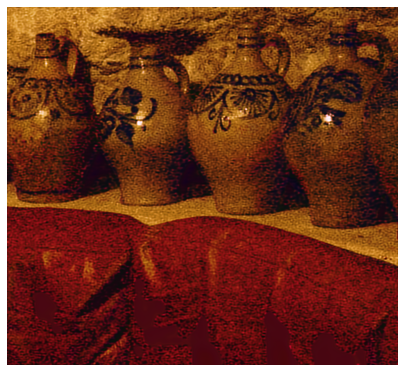

 total_loss:tensor(0.0042)004156 


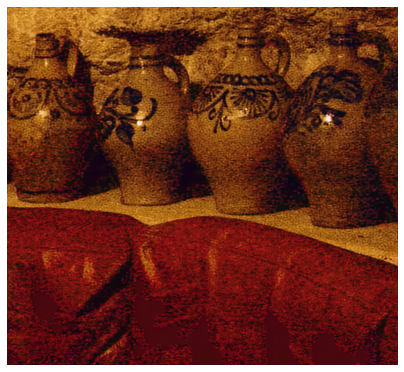

 total_loss:tensor(0.0041)004098 


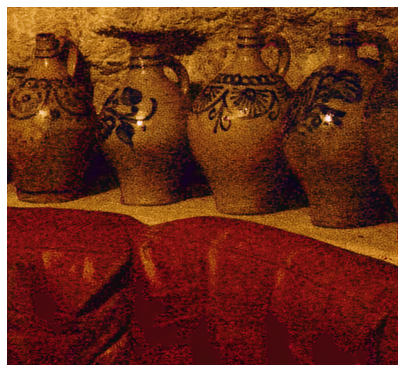

 total_loss:tensor(0.0040)004020 


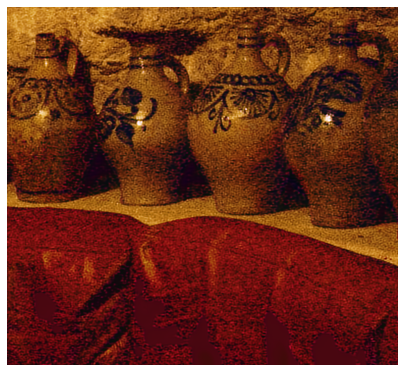

 total_loss:tensor(0.0040)003959 


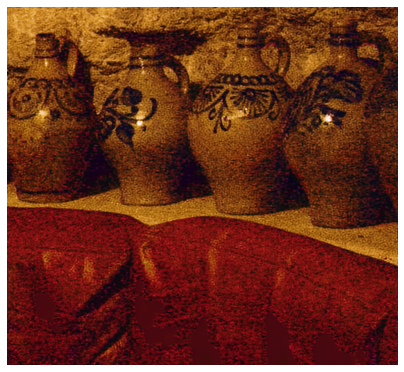

 total_loss:tensor(0.0039)003890 


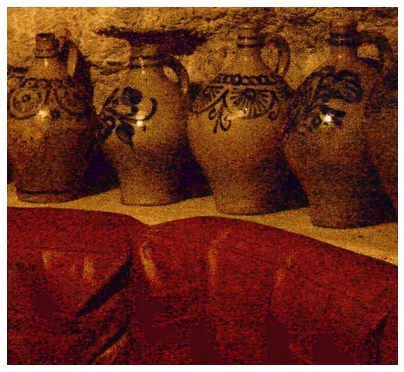

 total_loss:tensor(0.0038)003822 


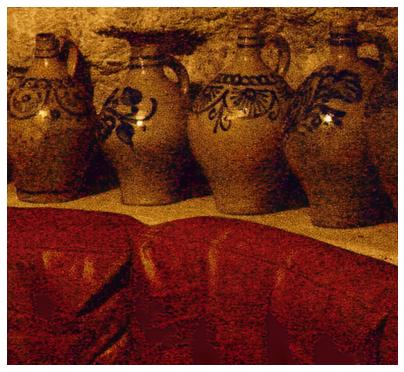

 total_loss:tensor(0.0037)003748 


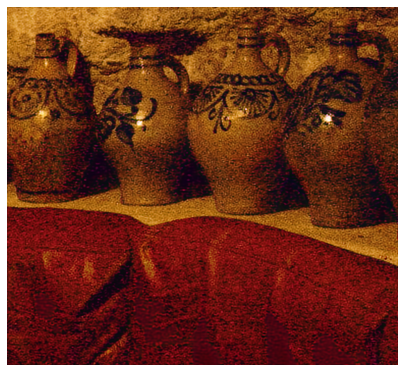

 total_loss:tensor(0.0037)003658 


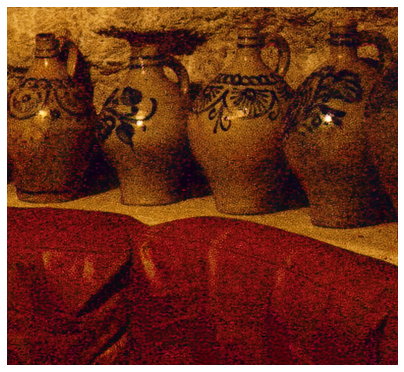

 total_loss:tensor(0.0036)003589 


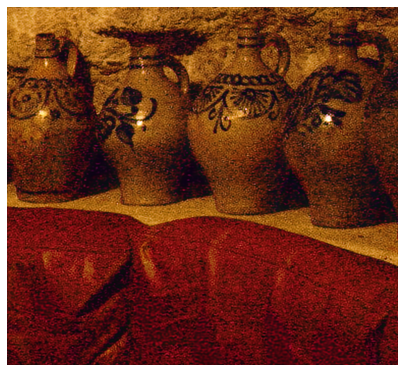

Elapsed time is 173.7342493534088 seconds.


In [23]:
# del opt_bfgs
durations = list()
from copy import deepcopy
# feat_opt = feat_ref.clone()
loss_list_param = list()
opt_names = list()
# for optalg_it in ['adam','LBFGS']:
for optalg_it in ['LBFGS']:
    for param_it in range(0,1):
        stepsz= (5**param_it)*10
        feat_opt= deepcopy(feat_ref)
        feat_opt.requires_grad= True
        # net_hl.eval()
        #out_list = out_list[:5]

        loss_list2 = list()
        i= 0
        
        print("feat_opt shape:"+str(feat_opt.shape))
        #p = [feat_opt] #+ get_params(OPT_OVER, net_hl, net_input)
        p= get_params(OPT_OVER, net_hl, net_input) +[feat_opt]
        num_iter_bfgs=1201
        tic()
        opt_bfgs =optimize(optalg_it, p, closure_bfgs, LR*10, num_iter_bfgs)
        opt_names.append(optalg_it+"-"+str(stepsz))
        durations.append(toc())
        loss_list_param.append(loss_list2)
        del opt_bfgs

Sometimes the process stucks at reddish image, just run the code from the top one more time. 

In [13]:
print(net_hl)
print(feat_ref.shape)

Sequential(
  (1): Concat(
    (0): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((0, 0, 0, 0))
        (1): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
      )
      (2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (1): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2))
      )
      (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): LeakyReLU(negative_slope=0.2, inplace=True)
      (4): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1))
      )
      (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): LeakyReLU(negative_slope=0.2, inplace=True)
      (7): Upsample(scale_factor=2.0, mode=bilinear)
    )
  )
  (2): BatchNor

In [48]:
loss_list_param = np.asarray(loss_list_param)

loss_list = np.asarray(loss_list)

In [49]:
numiters= len(loss_list)
loss_baseline = np.asarray(loss_baseline)
from scipy import interpolate
# timestep_baseline=np.arange(numiters)*dua_baseline
numiters= len(loss_list_param[0])
# duration_1stage= duration_1stage*()
tmp = duration_1stage*np.arange(len(loss_list))
timestep = tmp[-1]+ np.arange(numiters)*(durations[-1]/num_iter_bfgs)
timestep = np.hstack((tmp,timestep))
# f = interpolate.interp1d( loss_list)


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


(51,)
(51,)
(77,)
(1, 77)


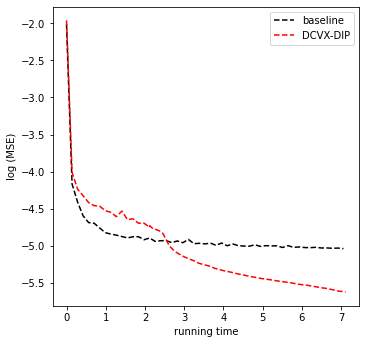

In [50]:
timestep_baseline=np.arange(len(loss_baseline))*dua_baseline
# print(loss_list.shape)
# print(loss_list_param.shape)
loss_array=np.hstack((np.tile(loss_list,(loss_list_param.shape[0],1)),loss_list_param))
# print(loss_array.shape)
import matplotlib.pyplot as plt
fig = plt.figure()
fig.set_size_inches(5.5, 5.5)
print(timestep_baseline.shape)
print(loss_baseline.shape)
plt.plot(timestep_baseline, np.log(loss_baseline), 'k--',label='baseline')
print(timestep.shape)
print(loss_array.shape)
timestep =timestep*(dua_baseline/duration_1stage)
plt.plot(timestep, np.log(loss_array[0]), 'r--',label='DCVX-DIP')
plt.ylabel('log (MSE)')
plt.xlabel('running time')
plt.legend(loc='best')
# plt.plot(timestep, np.log(loss_array[1]), 'k',label=opt_names[1])
plt.plot()
plt.savefig('converge.eps')
# f = interpolate.interp1d(, y)
# numiters=len()
# f2 = interpolate.interp1d(np.arange(numiters)*duration_1stage, loss_list)

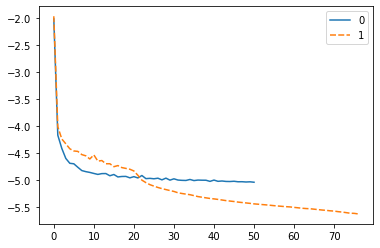

In [30]:
import seaborn as sns
# fmri = sns.load_dataset("fmri")
# # print(fmri)
# sns.set(style="darkgrid")
import pandas as pd
# # loss_array_norm = loss_array - loss_array.min()+10**(-20)
# loss_array_norm = np.log(loss_array)
# fmri = pd.DataFrame({opt_names[0]: loss_array_norm[0],opt_names[1]: loss_array_norm[1],
#                      opt_names[2]: loss_array_norm[2],opt_names[3]: loss_array_norm[3],
#                         opt_names[4]: loss_array_norm[4],opt_names[5]: loss_array_norm[5]})
df = pd.DataFrame({'DIP': np.log(loss_baseline)})
df1 = pd.DataFrame({'DCVX-DIP': np.log(loss_array[0])})

fmri=pd.concat([df,df1], ignore_index=True, axis=1)
# Load an example dataset with long-form data
# fmri = sns.load_dataset("fmri")
# print(fmri)
# Plot the responses for different events and regions
sns.lineplot(#x="timepoint", # y="signal",
             hue="region", style="event",
             data=fmri)
# # print(fmri)
# # print(fmri)

In [21]:
print(timestep)
print(duration_1stage)
print(dua_baseline)

[0.         0.24536019 0.49072039 0.73608058 0.98144078 1.22680097
 1.47216117 1.71752136 1.96288156 2.20824175 2.45360195 2.69896214
 2.94432234 3.18968253 3.43504273 3.68040292 3.68040292 3.82880003
 3.97719715 4.12559426 4.27399138 4.42238849 4.57078561 4.71918272
 4.86757984 5.01597695 5.16437407 5.31277118 5.4611683  5.60956541
 5.75796253 5.90635964 6.05475675 6.20315387 6.35155098 6.4999481
 6.64834521 6.79674233 6.94513944 7.09353656 7.24193367 7.39033079
 7.5387279  7.68712502 7.83552213 7.98391925 8.13231636 8.28071348
 8.42911059 8.5775077  8.72590482 8.87430193 9.02269905 9.17109616
 9.31949328 9.46789039 9.61628751]
0.24536019464663889
0.1412


c:\users\wnjq9\.conda\envs\siammask\lib\site-packages\torch\nn\functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


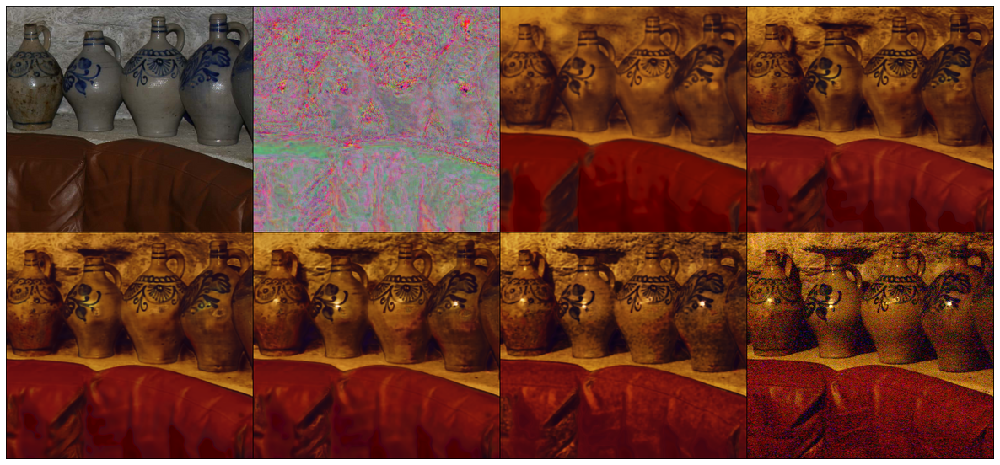

In [18]:
# out_np = torch_to_np(net(net_input))
out_np1 = torch_to_np(net_hl(feat_ref))
out_np2 = torch_to_np(net_hl(feat_opt))
if len(out_list)>=7:
    out_list = out_list[:7]
out_list.append(img_noflash_np)
q = plot_image_grid(out_list,nrow=4, factor=13);